In [21]:
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
from torch.utils.tensorboard import SummaryWriter
from torch.utils.data import ConcatDataset
from sklearn.metrics import f1_score, accuracy_score
import torch.nn.functional as F
from torchvision import models
import torchvision.models as models
from torch.autograd import Variable
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score

# TASK 2

In [11]:
# Define transformations for the training dataset
train_transforms = transforms.Compose([
    # Convert image from PIL format to tensor
    transforms.PILToTensor(),
    # Change image type to float for compatibility with PyTorch
    transforms.ConvertImageDtype(torch.float),
    # Resize images to 224x224 pixels
    transforms.Resize((224, 224)),
    # Normalize images using mean and std for each color channel
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# Define transformations for the test dataset (same as training)
test_transforms = transforms.Compose([
    transforms.PILToTensor(),
    transforms.ConvertImageDtype(torch.float),
    transforms.Resize((224, 224)),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# Load the training dataset with specified transformations
train_dataset = datasets.Flowers102(root='data', split='train', transform=train_transforms, download=True)

# Load the validation dataset with test transformations
val_dataset = datasets.Flowers102(root='data', split='val', transform=test_transforms, download=True)

# Load the test dataset with test transformations
test_dataset = datasets.Flowers102(root='data', split='test', transform=test_transforms, download=True)

In [12]:
# Create a DataLoader for the training dataset
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, num_workers=2)

# Create a DataLoader for the validation dataset (no shuffling)
val_loader = DataLoader(val_dataset, batch_size=16, shuffle=False, num_workers=2)

# Create a DataLoader for the test dataset (no shuffling)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False, num_workers=2)

In [13]:
# Set the device to GPU if available, otherwise use CPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [14]:
# Get one batch of data from train_loader
inputs, classes = next(iter(train_loader))

# Set the figure size for the plot
plt.figure(figsize=(30, 16), dpi=1000)

# Use the actual batch size
batch_size = inputs.size(0)

for i in range(batch_size):  # Use the batch size instead of a fixed value
    plt.subplot(4, 8, i + 1)  # Adjust the number of rows and columns based on the batch size
    plt.imshow(inputs[i].numpy().transpose((1, 2, 0)))  # Convert tensor to image format
    plt.title(f'Class: {classes[i].item()}')  # Add title with the class label
    plt.axis('off')  # Turn off the axes

# Display the images
plt.show()

In [15]:
# Number of training epochs
epochs = 10

# Learning rate for the optimizer
lr = 0.001

# Define the loss function as Cross Entropy Loss for multi-class classification
criterion = nn.CrossEntropyLoss()
def train(model, train_loader, criterion, optimizer):
    model.train()  # Set model to training mode
    running_train_loss = 0.0  # Accumulate training loss
    train_correct = 0  # Count correct predictions
    train_total = 0  # Total examples processed
    train_preds, train_labels = [], []  # Store predictions and true labels

    for inputs, labels in train_loader:  # Iterate over batches
        optimizer.zero_grad()  # Reset gradients
        outputs = model(inputs)  # Forward pass
        loss = criterion(outputs, labels)  # Compute loss
        loss.backward()  # Backward pass to compute gradients
        optimizer.step()  # Update model parameters

        running_train_loss += loss.item()  # Accumulate loss
        _, predicted = torch.max(outputs, 1)  # Get predicted classes

        train_total += labels.size(0)  # Update total examples
        train_correct += (predicted == labels).sum().item()  # Count correct predictions
        train_preds.extend(predicted.cpu().numpy())  # Store predictions
        train_labels.extend(labels.cpu().numpy())    # Store true labels

    # Calculate average loss and metrics after training epoch
    train_loss = running_train_loss / len(train_loader)  # Average training loss
    train_accuracy = 100 * train_correct / train_total   # Training accuracy in percentage
    train_f1 = f1_score(train_labels, train_preds, average="weighted")  # F1 score

    return train_loss, train_accuracy, train_f1  # Return training results

In [16]:
# Evaluation function for validation set
def evaluate(model, val_loader, criterion):
    model.eval()  # Set model to evaluation mode
    running_val_loss = 0.0  # Accumulate validation loss
    val_correct = 0  # Count correct predictions
    val_total = 0   # Total examples processed
    val_preds, val_labels = [], []  # Store predictions and true labels

    with torch.no_grad():  # Disable gradient calculation for efficiency
        for inputs, labels in val_loader:  # Iterate over validation batches
            outputs = model(inputs)   # Forward pass
            loss = criterion(outputs, labels)   # Compute loss

            running_val_loss += loss.item()   # Accumulate loss
            _, predicted = torch.max(outputs, 1)   # Get predicted classes

            val_total += labels.size(0)   # Update total examples
            val_correct += (predicted == labels).sum().item()   # Count correct predictions
            val_preds.extend(predicted.cpu().numpy())   # Store predictions
            val_labels.extend(labels.cpu().numpy())     # Store true labels

    # Calculate average loss and metrics after evaluation
    val_loss = running_val_loss / len(val_loader)   # Average validation loss
    val_accuracy = 100 * val_correct / val_total     # Validation accuracy in percentage
    val_f1 = f1_score(val_labels, val_preds, average="weighted")   # F1 score

    return val_loss, val_accuracy, val_f1   # Return evaluation results

In [17]:
# Load pre-trained ResNet-50 model
model = models.resnet50(pretrained=True)

# Remove the last layer for feature extraction
model = torch.nn.Sequential(*(list(model.children())[:-1]))

# Move model to the specified device (GPU or CPU)
model.to(device)

# Set model to evaluation mode
model.eval()

# Function to extract features from a data loader
def extract_features(data_loader):
    features = []  # List to hold extracted features
    with torch.no_grad():  # Disable gradient computation
        for images, _ in data_loader:  # Iterate over batches
            images = images.to(device)  # Move images to device
            feature = model(images).flatten(start_dim=1)  # Extract and flatten features
            features.append(feature.cpu().numpy())  # Convert to NumPy and store
    return np.concatenate(features)  # Concatenate all features

# Extract features from the training dataset
img_features = extract_features(train_loader)

In [23]:
# Standardize the feature vectors
scaler = StandardScaler()
features_scaled = scaler.fit_transform(img_features)

# The shape after scaling
print("Scaled feature shape:", features_scaled.shape)

Scaled feature shape: (1020, 2048)


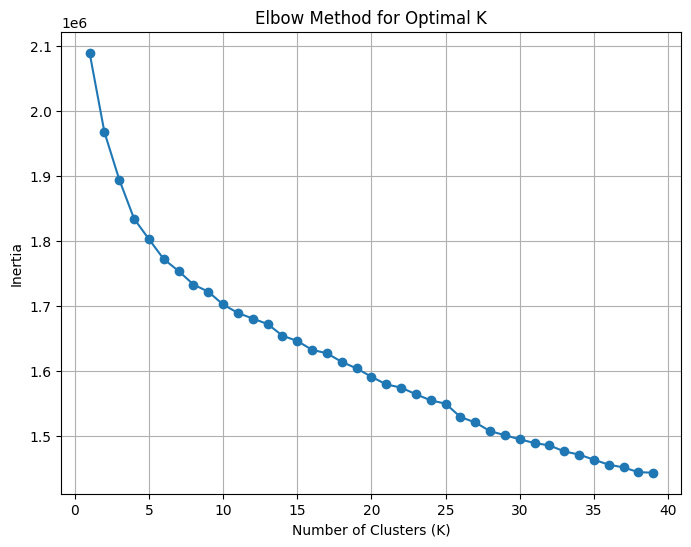

In [31]:
# Elbow Method to determine the optimal number of clusters
inertia = []  # List to store inertia values for each k
k_range = range(1, 40)  # Range of cluster numbers to test

# Loop through the range of k values
for k in k_range:
    # Initialize KMeans with the current number of clusters
    kmeans = KMeans(n_clusters=k, random_state=42)
    # Fit the model to the scaled features
    kmeans.fit(features_scaled)
    # Append the inertia (sum of squared distances to closest cluster center) to the list
    inertia.append(kmeans.inertia_)

# Plot the elbow curve to visualize inertia against the number of clusters
plt.figure(figsize=(8, 6))
plt.plot(k_range, inertia, marker='o')  # Plotting inertia values
plt.title('Elbow Method for Optimal K')  # Title for the plot
plt.xlabel('Number of Clusters (K)')  # X-axis label
plt.ylabel('Inertia')  # Y-axis label
plt.grid(True)  # Enable grid for better readability
plt.show()  # Display the plot

In [32]:
# Set the number of clusters to 13
k = 13

# Initialize KMeans with 13 clusters, using 'k-means++' for better initialization
kmeans = KMeans(n_clusters=k, init='k-means++', random_state=0)

# Fit the KMeans model to the image features
kmeans.fit(img_features)

# Retrieve the labels assigned to each data point (image feature)
labels = kmeans.labels_

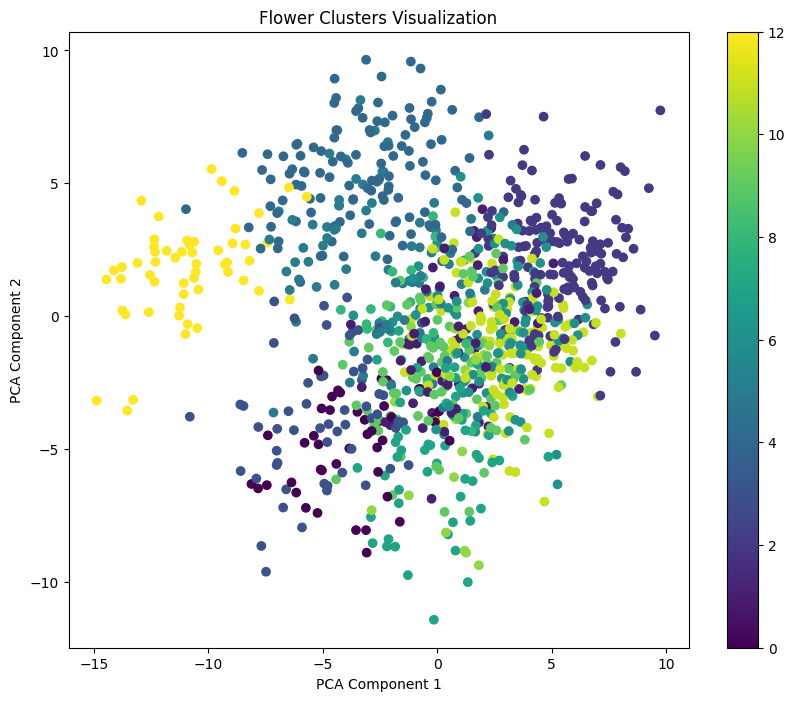

In [33]:
# Initialize PCA to reduce features to 2 dimensions
pca = PCA(n_components=2)

# Fit PCA on image features and transform them to lower dimensions
reduced_features = pca.fit_transform(img_features)

# Create a scatter plot to visualize the reduced features
plt.figure(figsize=(10, 8))
scatter = plt.scatter(reduced_features[:, 0], reduced_features[:, 1], c=labels, cmap='viridis')

# Set the title and labels for the plot
plt.title('Flower Clusters Visualization')  # Title of the plot
plt.xlabel('PCA Component 1')  # X-axis label for first PCA component
plt.ylabel('PCA Component 2')  # Y-axis label for second PCA component

# Add a color bar to indicate cluster labels
plt.colorbar(scatter)

# Display the plot
plt.show()

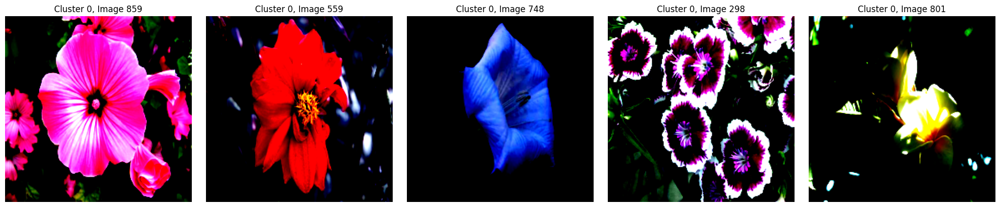

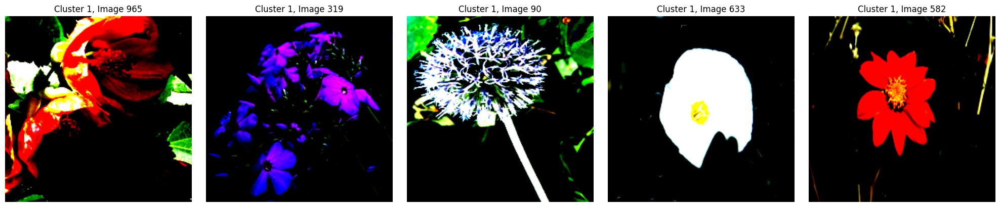

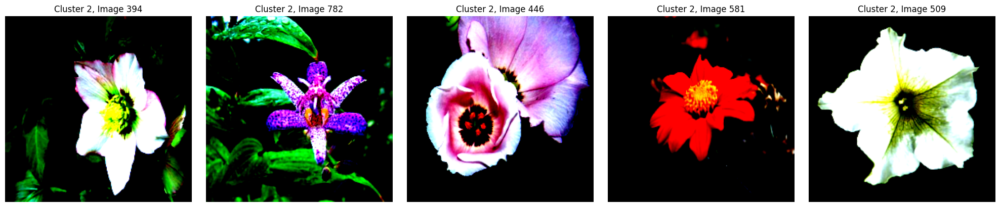

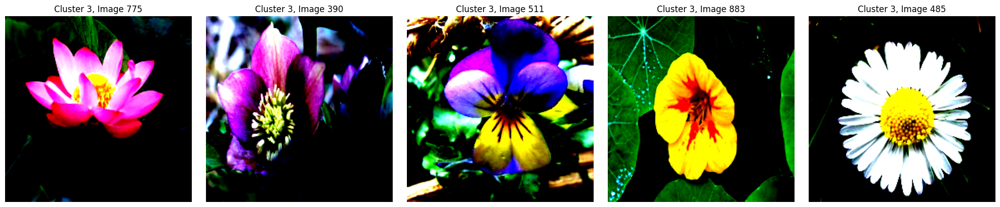

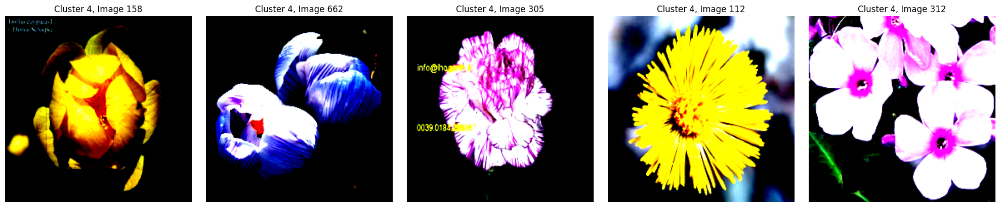

...

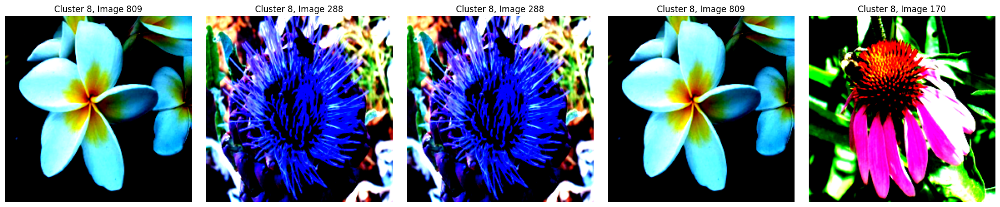

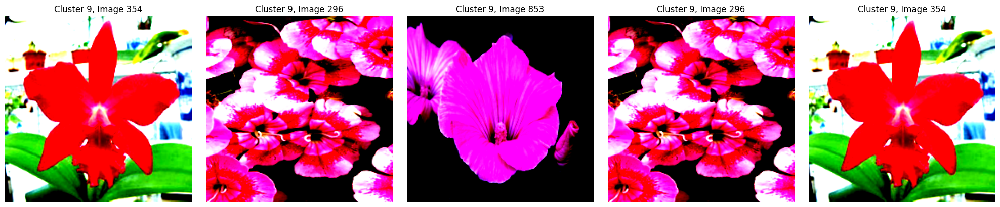

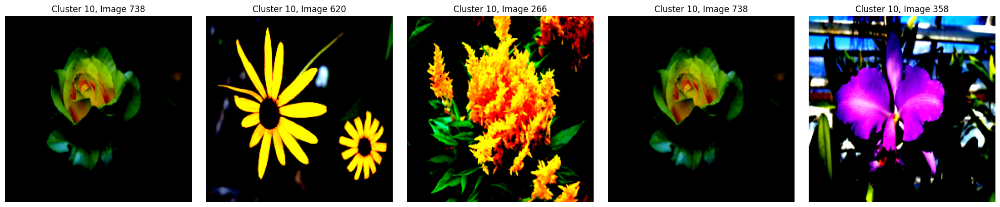

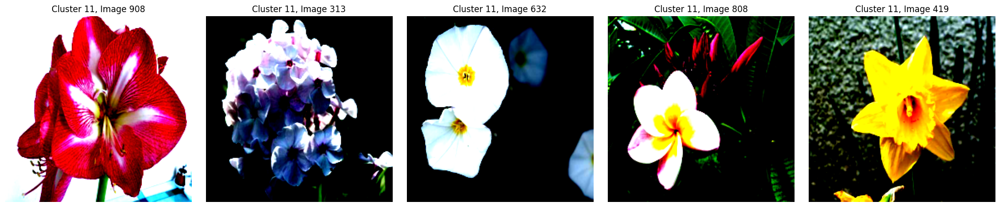

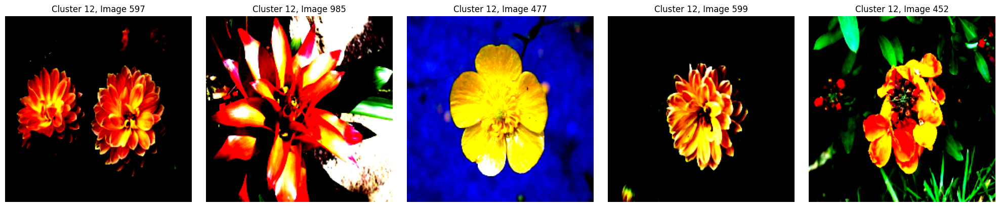

In [47]:
# Retrieve images from train_loader for display (using train_dataset)
all_images = [img[0] for img in train_dataset]  # Get all images from train_dataset

# Display random images from each cluster
for cluster in range(k):  # Iterate over all clusters
    cluster_indices = np.where(labels == cluster)[0]  # Get indices of images in the current cluster

    # If there are fewer than 5 images in the cluster, select all available images
    num_images_to_select = min(5, len(cluster_indices))

    if num_images_to_select > 0:
        selected_indices = np.random.choice(cluster_indices, num_images_to_select, replace=True)

        fig, axs = plt.subplots(1, num_images_to_select, figsize=(20, 4))  # Create subplots for selected images
        axs = axs.ravel()  # Flatten the array of axes for easy indexing

        for i, idx in enumerate(selected_indices):
            image = all_images[idx].permute(1, 2, 0)  # Convert tensor to image format (HWC)
            axs[i].imshow(image.numpy())  # Display the image
            axs[i].set_title(f'Cluster {cluster}, Image {idx}')  # Set title with cluster number and image index
            axs[i].axis('off')  # Turn off axes

        plt.tight_layout()  # Adjust layout to prevent overlap
        plt.show()  # Show the plot with selected images

# Report on Clustering Flower Images Using Deep Learning Techniques

**Goal**

The primary goal of this task is to cluster images of flowers into distinct groups based on their visual features using unsupervised learning techniques. By leveraging deep learning techniques, specifically a pre-trained Convolutional Neural Network (CNN), the aim is to extract meaningful feature representations from flower images and categorize them into distinct clusters. This process will facilitate better organization, retrieval, and classification of images based on inherent visual characteristics.

**Approach**

**Data Loading & Preprocessing:**

The Flowers dataset was loaded using the torchvision.datasets library. To prepare the images for feature extraction, appropriate transformations were applied, including resizing and normalization. These preprocessing steps ensured that all images were of uniform size and scale, which is crucial for effective training and feature extraction.

**Feature Extraction:**

A pre-trained CNN model, such as ResNet-50, was utilized to extract feature vectors from the flower images. This process involved leveraging transfer learning, allowing the model to use learned features from a large dataset (e.g., ImageNet) to improve performance on the flower dataset. The preprocessed images were passed through the CNN to obtain high-dimensional feature representations that capture essential visual characteristics.

**Clustering:**

The extracted features were then clustered using the K-Means algorithm. To determine the optimal number of clusters, the Elbow Method was employed, which revealed that the ideal number of clusters is 13. This method analyzes inertia values across different cluster counts to identify a point where adding more clusters yields diminishing returns in clustering performance.

**Clusters Visualization:**

To visualize the clustering results, Principal Component Analysis (PCA) was used to reduce the dimensionality of the feature vectors to two dimensions. A scatter plot was generated, where each point represented an image colored according to its assigned cluster label. This visualization helped illustrate how well the clustering algorithm grouped similar flowers together.

**Image Retrieval and Display:**

Images were retrieved from the training dataset for display purposes. Random samples from each cluster were selected and displayed to provide insights into how similar flowers are grouped together visually. This step allowed for a better understanding of the clustering results by showcasing representative images from each identified cluster.

**Attained Results**

The implementation of this approach yielded several key results:

**Feature Representation:** The pre-trained CNN successfully extracted rich feature representations from flower images, capturing essential visual patterns critical for clustering.

**Clustering Performance:** The K-Means algorithm effectively categorized the flower images into distinct clusters, with 13 identified as the optimal number through the Elbow Method.

**Visualization Insights:** The PCA-generated scatter plot highlighted how flowers with similar visual characteristics were grouped together, providing valuable insights into the underlying structure of the dataset.

**Image Samples:** The retrieval and display of random samples from each cluster illustrated how well similar flowers were grouped together visually.

Overall, this project demonstrated the effectiveness of combining deep learning techniques for feature extraction with unsupervised learning algorithms for clustering. It led to meaningful organization and analysis of flower images based on their visual attributes. This version presents your project in a clear and concise manner without including any code snippets.